# Part I - (Ford GoBike System Data Exploration)
## by Dada Olujare

## Introduction
> The dataset given contains information about individual rides made in a bike-sharing system covering the greater San Francisco Bay area.

> The dataset contains features like duration of travel, start and end times of the commute, names of the bike sharing stations, as well as their coordinates (longitude and latitude). We also have some user information like their year of birth, the type of user they are (either Customer or Subscriber), and their Gender.




## Preliminary Wrangling


In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

%matplotlib inline


sb.set(rc = {'figure.figsize':(12,8)})


> Load in your dataset and describe its properties through the questions below. Try and motivate your exploration goals through this section.


In [2]:
data = pd.read_csv("201902-fordgobike-tripdata.csv")
data.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
0,52185,2019-02-28 17:32:10.1450,2019-03-01 08:01:55.9750,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984.0,Male,No
1,42521,2019-02-28 18:53:21.7890,2019-03-01 06:42:03.0560,23.0,The Embarcadero at Steuart St,37.791464,-122.391034,81.0,Berry St at 4th St,37.775880,-122.393170,2535,Customer,NaN,NaN,No
2,61854,2019-02-28 12:13:13.2180,2019-03-01 05:24:08.1460,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972.0,Male,No
3,36490,2019-02-28 17:54:26.0100,2019-03-01 04:02:36.8420,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989.0,Other,No
4,1585,2019-02-28 23:54:18.5490,2019-03-01 00:20:44.0740,7.0,Frank H Ogawa Plaza,37.804562,-122.271738,222.0,10th Ave at E 15th St,37.792714,-122.248780,4898,Subscriber,1974.0,Male,Yes


In [3]:
data.describe()

,duration_sec,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,member_birth_year
count,183412.000000,183215.000000,183412.000000,183412.000000,183215.000000,183412.000000,183412.000000,183412.000000,175147.000000
mean,726.078435,138.590427,37.771223,-122.352664,136.249123,37.771427,-122.352250,4472.906375,1984.806437
std,1794.389780,111.778864,0.099581,0.117097,111.515131,0.099490,0.116673,1664.383394,10.116689
min,61.000000,3.000000,37.317298,-122.453704,3.000000,37.317298,-122.453704,11.000000,1878.000000
25%,325.000000,47.000000,37.770083,-122.412408,44.000000,37.770407,-122.411726,3777.000000,1980.000000
50%,514.000000,104.000000,37.780760,-122.398285,100.000000,37.781010,-122.398279,4958.000000,1987.000000
75%,796.000000,239.000000,37.797280,-122.286533,235.000000,37.797320,-122.288045,5502.000000,1992.000000
max,85444.000000,398.000000,37.880222,-121.874119,398.000000,37.880222,-121.874119,6645.000000,2001.000000


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183412 entries, 0 to 183411
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   duration_sec             183412 non-null  int64  
 1   start_time               183412 non-null  object 
 2   end_time                 183412 non-null  object 
 3   start_station_id         183215 non-null  float64
 4   start_station_name       183215 non-null  object 
 5   start_station_latitude   183412 non-null  float64
 6   start_station_longitude  183412 non-null  float64
 7   end_station_id           183215 non-null  float64
 8   end_station_name         183215 non-null  object 
 9   end_station_latitude     183412 non-null  float64
 10  end_station_longitude    183412 non-null  float64
 11  bike_id                  183412 non-null  int64  
 12  user_type                183412 non-null  object 
 13  member_birth_year        175147 non-null  float64
 14  memb

In [5]:
data.shape

(183412, 16)

### What is the structure of your dataset?

> The dataset has 183,412 rows with 16 columns

### What is/are the main feature(s) of interest in your dataset?

> The dataset is missing some values but these values make up less than 5% of the entire dataset

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> duration_sec, start_time, end_time, start_station_name, end_station_name, member_gender, user_type, and member_birth_year

## Viewing the Relationship

In this notebook, we will explore the data in order to answer the following questions and more


1. When are most trips taken in terms of time of day, day of the week, or month of the year?

2. How long does the average trip take?

3. The gender distribution of the dataset?

4. Which station has the most takeoffs

5. Which station has the most arrivals

6. Which station has the longest trips?

7. Gender Distribution

8. Age Distribution

9. User Distribution

10. User- Gender Distribution

11. User - Age Distribution

12. Which bike has the most rides. 

13. Do the bikes with the most rides have anything to do with where they carry customers to?

14. Which biker has the shortest rides and does this correlate with the number of rides they have?

15. The closest stations and does closeness facilitate more commute between stations?


## Univariate Exploration


The start_time and end_time columns are read as objects in pandas. We need to convert them to datetime columns

In [6]:
def set_time_dtype(column_name, dataframe_object):
    dataframe_object[column_name] = dataframe_object[column_name].values.astype("datetime64[ns]")
    print(f"The datatype is now:\n\n{dataframe_object[column_name].dtype}")
    return dataframe_object[column_name]

In [7]:
data["start_time"] = set_time_dtype("start_time", data)

The datatype is now:

datetime64[ns]


In [8]:
data["end_time"] = set_time_dtype("end_time", data)

The datatype is now:

datetime64[ns]


Investigating the distribution of the member_birth_year

<AxesSubplot:>

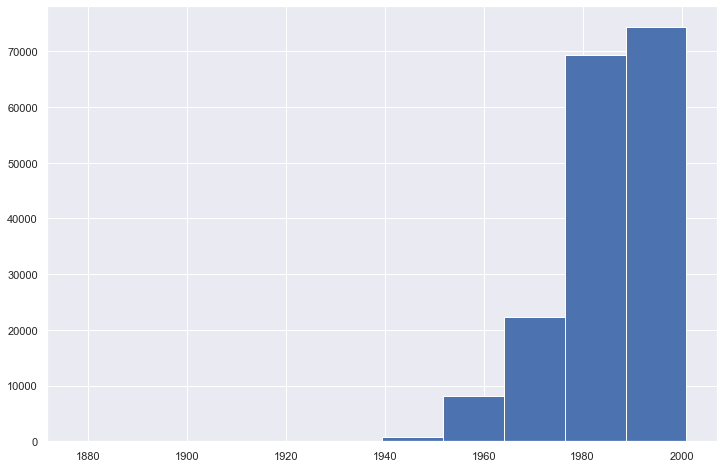

In [9]:
#Plotting the histogram for the member_birth_year column
data["member_birth_year"].hist()

There are some birth years that greatly skew the distribution to the left.

In [10]:
print(f"The 0.5 percentile of the data is {data['member_birth_year'].quantile(0.005)}")

The 0.5 percentile of the data is 1951.0


The 0.5 percentile is 1957. This means that starting from 1957 upwards, we still get to explore 99.5% of the dataset. We can therefore use this in order to remove the influence of the outliers.

<AxesSubplot:ylabel='Frequency'>

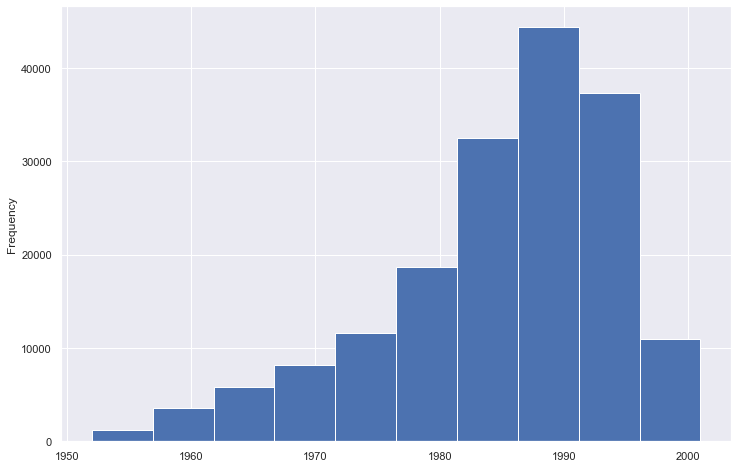

In [11]:
data[data["member_birth_year"] > data["member_birth_year"].quantile(0.005)]["member_birth_year"].plot(kind= "hist")

In order for this to be more intuitive, it makes sense to create a user_age column

In [12]:
#Calculating
data["user_age"] = data["start_time"].dt.year - data["member_birth_year"]

<AxesSubplot:>

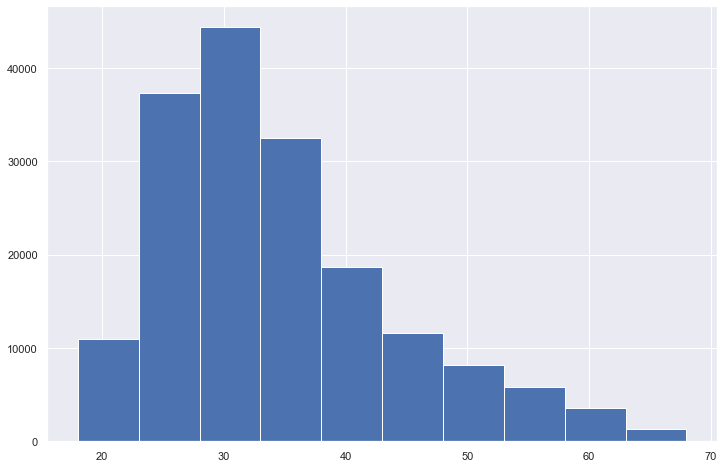

In [13]:
data[data["user_age"] <= data["user_age"].quantile(0.995)]["user_age"].hist()

The member_birth year has some missing values and we should take care of them.

In [14]:
print(f"There are {data['member_birth_year'].isnull().sum()} null values in the member_birth_year column")

There are 8265 null values in the member_birth_year column


Remove all the null values in the member_birth_year column 

In [15]:
data = data[~data["member_birth_year"].isnull()]
print(f"There are {data['member_birth_year'].isnull().sum()} null values in the member_birth_year column")

There are 0 null values in the member_birth_year column


Fill up all unknown gender columns with "unknown_gender"

In [16]:
data["member_gender"].fillna("unknown_gender", inplace = True)

We cannot fill up the missing end_station_name and start_station_name thus, we remove the empty values

In [17]:
data = data[~data["end_station_name"].isnull()].copy()

It makes sense to derive the day of the week from the start_time and end_time as it could be useful

In [18]:
data["start_weekday"] = data["start_time"].dt.day_name()
data["end_weekday"] = data["end_time"].dt.day_name()

We can also derive hour_of_the_day column which tells us the correct hour

In [19]:
data["start_hour_of_the_day"] = data["start_time"].dt.hour
data["end_hour_of_the_day"] = data["end_time"].dt.hour

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174952 entries, 0 to 183411
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   duration_sec             174952 non-null  int64         
 1   start_time               174952 non-null  datetime64[ns]
 2   end_time                 174952 non-null  datetime64[ns]
 3   start_station_id         174952 non-null  float64       
 4   start_station_name       174952 non-null  object        
 5   start_station_latitude   174952 non-null  float64       
 6   start_station_longitude  174952 non-null  float64       
 7   end_station_id           174952 non-null  float64       
 8   end_station_name         174952 non-null  object        
 9   end_station_latitude     174952 non-null  float64       
 10  end_station_longitude    174952 non-null  float64       
 11  bike_id                  174952 non-null  int64         
 12  user_type       

Saving the cleaned dataset for further exploration.

In [21]:
data.to_csv("cleaned_dataset.csv", index = False)

Load the new csv file into the workbook

In [22]:
new_data = pd.read_csv("cleaned_dataset.csv")

Question 1:

In [23]:
weekdays = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
new_data.groupby(["start_weekday"]).size().reindex(weekdays)

start_weekday
Monday       25641
Tuesday      30584
Wednesday    28426
Thursday     33712
Friday       27663
Saturday     14414
Sunday       14512
dtype: int64

Text(0.5, 0.98, 'Daily and Hourly Distribution of Rides (Start of Journey)')

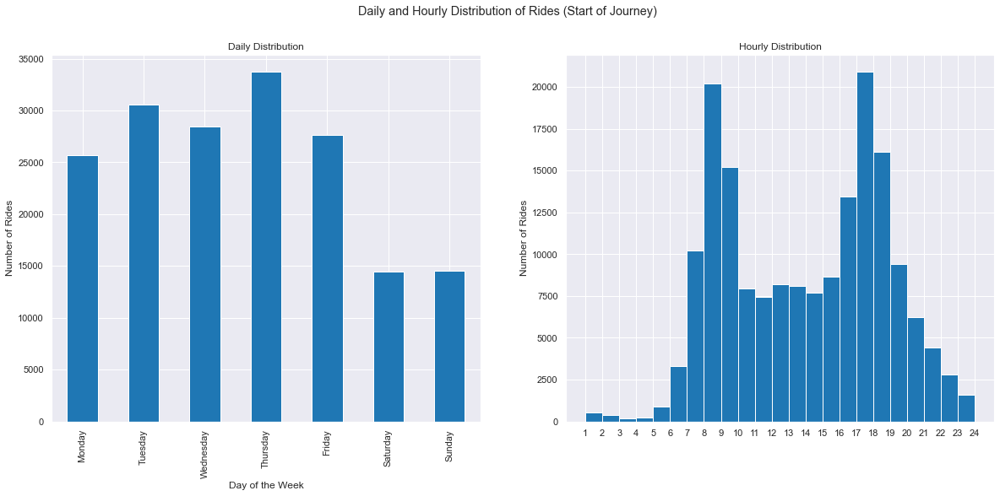

In [24]:
days_of_the_week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

bins = [x for x in range(1, 25, 1)]


fig, (ax1, ax2) = plt.subplots(1,2, figsize = (20, 8))


plt.title("Daily Distribution")
ax1.figsize = (10, 6)
new_data.groupby(["start_weekday"]).size().reindex(days_of_the_week).plot(kind = "bar", ax = ax1, xlabel = "Day of the Week",
                                                                         ylabel = "Number of Rides",
                                                                         title = "Daily Distribution", color = "tab:blue")


new_data["start_hour_of_the_day"].plot(kind = "hist", bins = bins, ax = ax2, title = "Hourly Distribution",
                                      xlabel = "Hour of the Day", color = "tab:blue")
plt.xticks(np.arange(min(bins), max(bins)+1, 1.0));
plt.ylabel ("Number of Rides")


plt.suptitle("Daily and Hourly Distribution of Rides (Start of Journey)")

Text(0.5, 0.98, 'Daily and Hourly Distribution of Rides (End of Journey)')

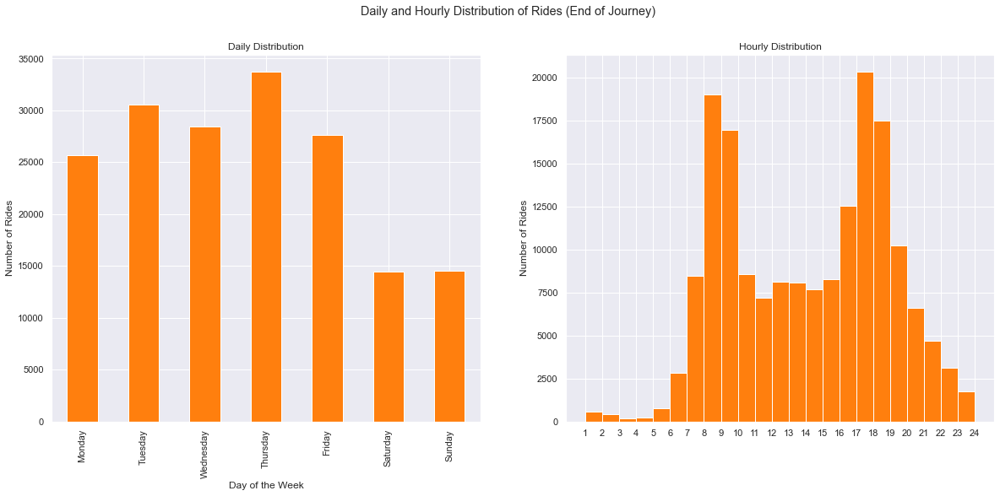

In [25]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (20, 8))


plt.title("Daily Distribution")
ax1.figsize = (10, 6)
new_data.groupby(["end_weekday"]).size().reindex(days_of_the_week).plot(kind = "bar", ax = ax1, xlabel = "Day of the Week",
                                                                         ylabel = "Number of Rides",
                                                                         title = "Daily Distribution", color = "tab:orange")


#plt.subplot(2,2,2)
#ax1.title("Hourly Distribution")
new_data["end_hour_of_the_day"].plot(kind = "hist", bins = bins, ax = ax2, title = "Hourly Distribution",
                                      xlabel = "Hour of the Day", color = "tab:orange")
plt.xticks(np.arange(min(bins), max(bins)+1, 1.0));
plt.ylabel ("Number of Rides")


plt.suptitle("Daily and Hourly Distribution of Rides (End of Journey)")


Result:

- The day of the week distributions are similar irrespective of whether it is the start or end of the journey. The hour of the day distributions are also similar irrespective of whether it is the start or end of the journey.

- Thursday is the day with the most bike activity followed by Tuesday.

- The weekends have the lowest amount of bike activity.

- The peak hours for bike activity are between 8am - 9am in the morning and 5pm - 6pm in the evening

Further Investigation:

- The number of biking activity for Saturday and Sunday is very low. This makes it possible that the hour distribution for both days might be different from the other weekdays. This subject will be investigated in the Bivariate section of this notebook.

Question 2:

The duration_sec distribution is highly skewed to the right. This is depicted below

<AxesSubplot:>

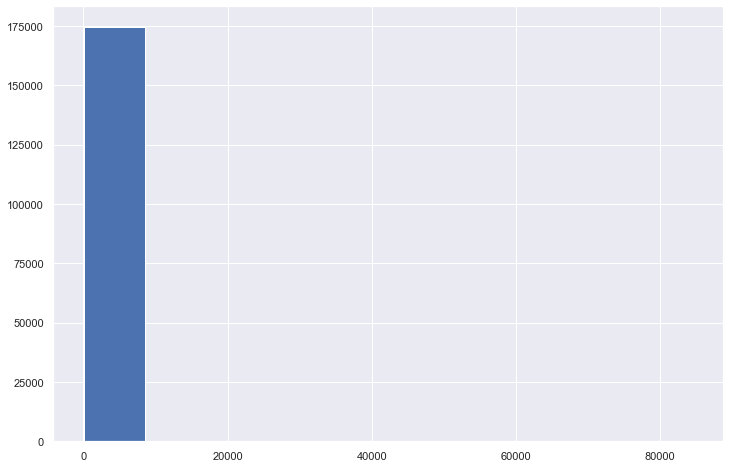

In [26]:
new_data["duration_sec"].hist()

In [27]:
print(f"The mean of the duration_sec column is {new_data['duration_sec'].mean()} while the median is {new_data['duration_sec'].median()}")

The mean of the duration_sec column is 704.0027436096758 while the median is 510.0


We can choose 99.5% of the dataset just so that we can get rid of the outliers

In [28]:
new_data.duration_sec.quantile(0.995)

5038.734999999986

In [29]:
normal = new_data[new_data["duration_sec"] <=new_data["duration_sec"].quantile(0.995)]

Text(0.5, 1.0, 'Duration Distribution')

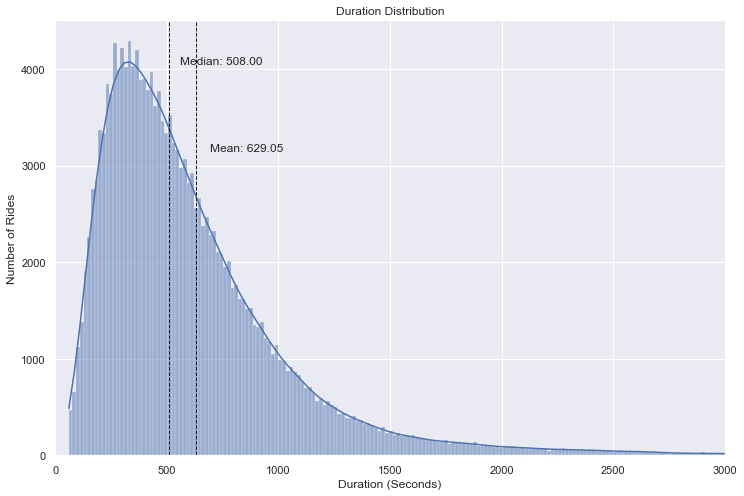

In [30]:
sb.histplot(data = normal, x = "duration_sec", kde = True)
plt.axvline(normal["duration_sec"].median(), color='k', linestyle='dashed', linewidth=1)
plt.axvline(normal["duration_sec"].mean(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.xlim(0, 3000)
plt.text(normal["duration_sec"].median()*1.1, max_ylim*0.9, 'Median: {:.2f}'.format(normal["duration_sec"].median()))
plt.text(normal["duration_sec"].mean()*1.1, max_ylim*0.7, 'Mean: {:.2f}'.format(normal["duration_sec"].mean()))

plt.xlabel("Duration (Seconds)")
plt.ylabel("Number of Rides")
plt.title("Duration Distribution")

Result:

- After taking the log of the y-axis, we have successfully compressed the histogram and thereby making the duration_sec distribution more obvious.

- The median duration_sec is 512 seconds.

- Therefore, the typical bike ride takes about 508 seconds or 8 minutes 32 seconds.

Further Investigation:

- It would be interesting to see how this duration distribution looks like when taking other demographies into consideration such as gender and user_type

Question 3

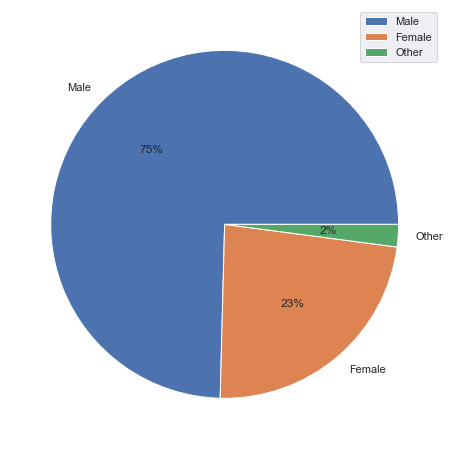

In [31]:
plt.figure(figsize = (8,8))
plt.pie(new_data["member_gender"].value_counts(), labels = new_data["member_gender"].value_counts().index, autopct='%.0f%%')
plt.legend();

Result:

- The overwhelming majority are men who represent 75% of the entire customer base
- Women make up 23% of the population while only 2% are neither male nor female.



>**Rubric Tip**: Visualizations should depict the data appropriately so that the plots are easily interpretable. You should choose an appropriate plot type, data encodings, and formatting as needed. The formatting may include setting/adding the title, labels, legend, and comments. Also, do not overplot or incorrectly plot ordinal data.

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

1. Member_birth_year distribution which showed the distribution of the ages of each bike rider.It was highly skewed to the left and required removing outliers.

2. The "user_age" column is derived from the member_birth_year column

3. The weekday distribution showed us that Thursday and Tuesday had the highest bike riding activities.

4. The duration_sec distribution was very highly skewed to the right and we had to reduce the data to 99.5% of its original value to remove outliers which enabled us see its distribution.

5. The gender distribution showed us that there are far more males in the bike sharing community.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

1. The member_birth_year column was highly skewed to the left and required removing outliers.

2. The "user_age" column is derived from the member_birth_year column.

3. Changed the datatype of the start_time and end_time columns to datetime

4. Removed all member_birth_year rows that skew the data.

5. Calculated the user_age column


## Bivariate Exploration

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

Section B Questions:

Question 1:
- Given that Saturday and Sunday have by far, the lowest bike activities, it would be worth while to investigate the hourly bike activity on both days.

- Another reason for this is that the general hourly trend shows us that 8-9am and 5-6pm are the peak periods for bike activities and this seems to reflect the rush hour periods of a typical weekday.


Question 2:
- Earlier, we looked into the duration distribution and saw that the typical bike ride lasted about 508 seconds.
- Now, we would like to know how this duration distribution varies with gender and the two user_types available.


Question 3:
- Another interesting question is which station has the most takeoffs and which one has the most arrivals?


Question 4:
- What routes (i.e. station-to-station travel) are the most common


Question 5:
- Do certain age groups tend to follow some routes more than others?


Question 6:
- Do certain user types or genders tend to follow some routes more than others?


Question 7:
- Check the number of rides against duration of the rides.

Question 1:

Text(0.5, 0.98, 'Hourly Distribution for each day of the Week')

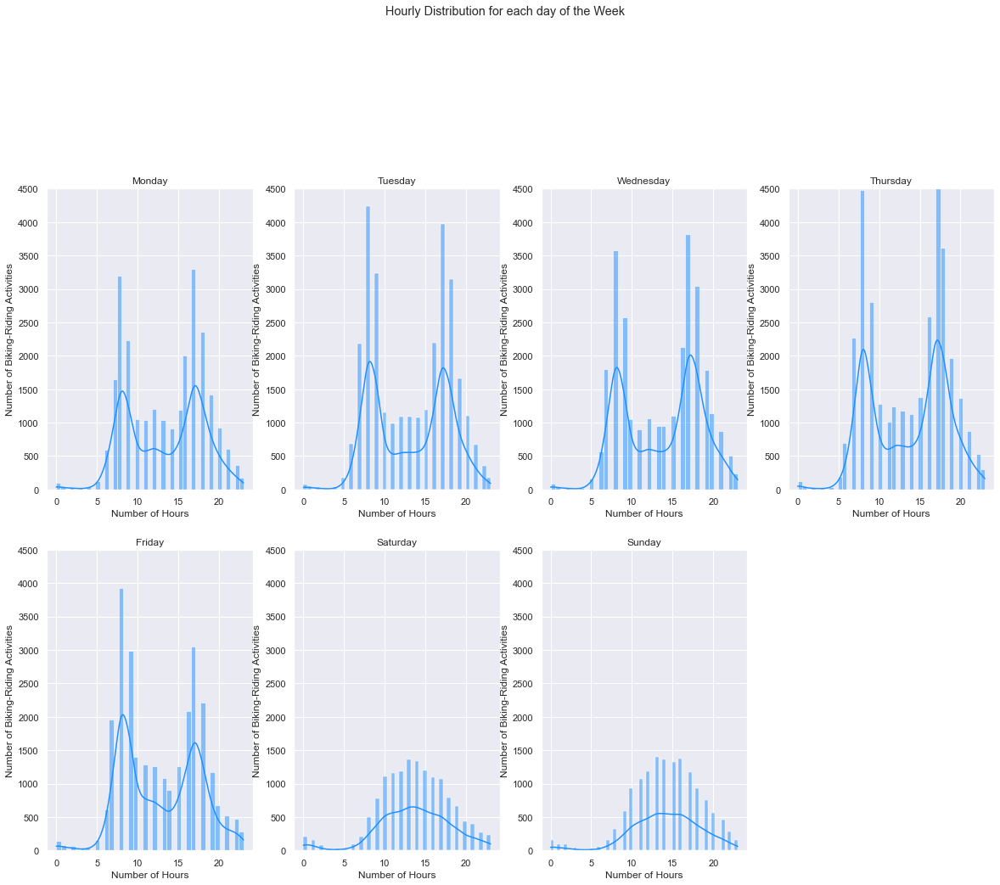

In [32]:
plt.figure(figsize = (20, 30))
plt.xlim(0, 25)

for i, day_name in enumerate(days_of_the_week):
    plt.subplot(4,4, i+1)
    plt.ylim(0, 4500)
    day_data = new_data[new_data["start_weekday"].isin([day_name])]
    sb.histplot(data = day_data, x = "start_hour_of_the_day", kde = True, shrink = 1, color = "dodgerblue")
    plt.title(day_name)
    plt.xlabel("Number of Hours")
    plt.ylabel("Number of Biking-Riding Activities")

plt.suptitle("Hourly Distribution for each day of the Week")

Result:

- As suspected, the distribution for the weekends is very different from the distribution during weekdays.

- The weekdays distributions retain the bi-modal curve further confirming the hunch that the overall distribution was following the pattern for rush hour periods in a normal work day.

- The weekend distributions however, show a different pattern. They show that there is only one peak period which is around 1pm-3pm on Saturdays and 1pm - 4pm on Sundays.

- Another noticeable difference is that while bike activities reach as high as 3000 to 4000 during weekdays, weekends have less than 1500 biking activities.

Question 2:

In [33]:
def make_duration_histogram(demographic_df, color, xlabel, ylabel, title, legend, x,y):
    """This function helps us make histograms for the Duration in seconds against a particular demographic.
    
    It takes in some arguments:
    1. demographic_df: This is the dataframe containing the demographic whose bikiing duration we want to see displayed.
    2. color: This gives the color of the histogram.
    3. xlabel: This is simply the duration values from the duration_sec column.
    4. ylabel: This is the frequency of occurrence or the Number of rides per duration.
    5. title: This is the title of the entire diagram.
    6. legend: This gives the legend of the entire histogram.
    
    """
    sea_plot = sb.histplot(data = demographic_df, x = "duration_sec", kde = "True", color =color)
    sea_plot.set_xlim(0, 3000)
    plt.axvline(demographic_df["duration_sec"].median(), color='k', linestyle='dashed', linewidth=1)
    #plt.axvline(demographic_df["duration_sec"].mean(), color='k', linestyle='dashed', linewidth=1)
    min_ylim, max_ylim = plt.ylim()
    plt.text(demographic_df["duration_sec"].median()*x, max_ylim*y, 'Median: {:.2f}'.format(demographic_df["duration_sec"].median()))
    #plt.text(demographic_df["duration_sec"].mean()*1.02, max_ylim*0.7, 'Mean: {:.2f}'.format(demographic_df["duration_sec"].mean()))
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend([legend])

In [34]:
max_ylim

4503.45

In [35]:
#Creating two normal distributions for the customer and subscriber
customer_normal = normal[normal["user_type"] == "Customer"]
subscriber_normal = normal[normal["user_type"] == "Subscriber"]

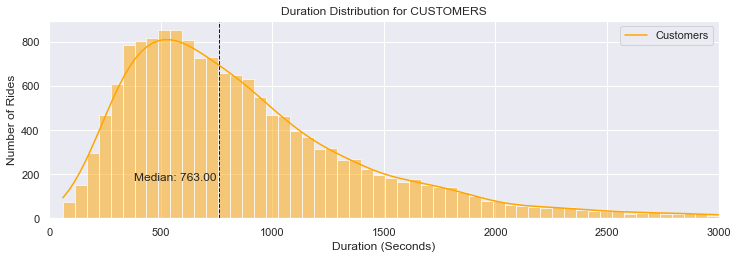

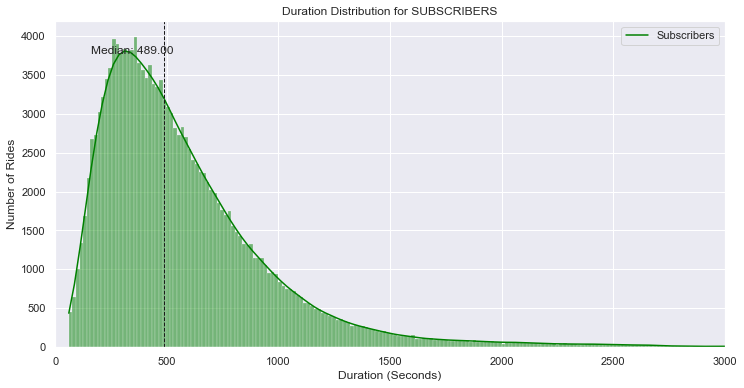

In [36]:
plt.subplot(211)
make_duration_histogram(customer_normal, color = "orange", xlabel = "Duration (Seconds)", ylabel = "Number of Rides",
                       title = "Duration Distribution for CUSTOMERS", legend = "Customers", x = 0.5, y = 0.19)

plt.figure(figsize = (12, 6))
make_duration_histogram(subscriber_normal, color = "green", xlabel = "Duration (Seconds)", ylabel = "Number of Rides",
                       title = "Duration Distribution for SUBSCRIBERS", legend = "Subscribers", x = 0.33, y = 0.9)

Result:

- The Customers had far less bike activity and this is due to the fact that  there are more than 10 times more Subscribers as there are Customers.

- The median riding duration for Customers is 763 seconds while the median for Subscribers is 489 seconds. This means that typically, a Customer rides the bikes for a longer period of time than a Subscriber.

- This difference is about 274 seconds which roughly equates to 4 minutes 34 seconds. We can thus hypothesize that Customers are generally more fit than Subscribers. But this is dependent on whether a difference of riding time of 4 minutes, 34 seconds is enough to establish this hypothesis.

- Another implication is that Customers typically tend to cover more distance 

In [37]:
male_normal = normal[normal["member_gender"] == "Male"]
female_normal = normal[normal["member_gender"] == "Female"]

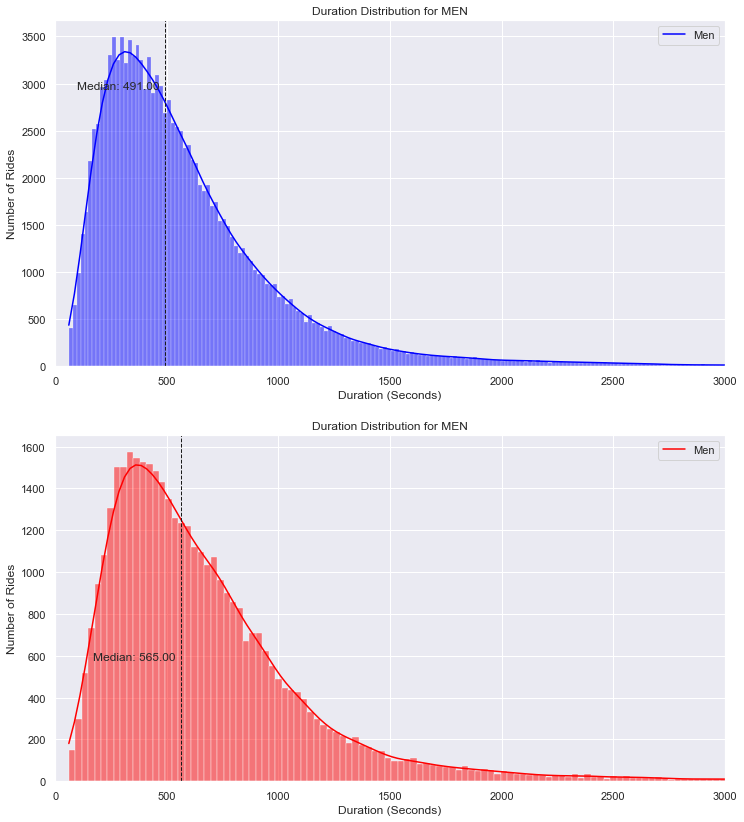

In [38]:
plt.figure(figsize = (12, 14)) 
plt.subplot(211)

make_duration_histogram(male_normal, "blue", "Duration (Seconds)", "Number of Rides", "Duration Distribution for MEN",
                       "Men", 0.2, 0.8)

plt.subplot(212)
make_duration_histogram(female_normal, "red", "Duration (Seconds)", "Number of Rides", "Duration Distribution for MEN",
                       "Men", 0.3, 0.35)

Result:

- As expected, more men take up more rides than women since there are generally more men as bike users.

- Men are generally regarded as physically stronger than Ladies but not in this case. The Ladies typically ride bikes much longer than their Male counterparts. On the other hand, it could also mean that the women in this area are more physically fit than the Men. Whatever the case,,this difference is more than a minute long and would require more investigation to justify the hypothesis that the Ladies in this part of the United States are more fit than Men.

Question 3:

Which station(s) has the most takeoffs?

In [39]:
def make_hbar_chart(dataframe_obj, y_column, x_column, color, xlabel, ylabel, title):
    """
    This function helps us plot bar charts. It takes in the following parameters:
    1. dataframe_obj: The dataframe that contains the data we want to plot.
    2. y_column: This is the column from the dataframe that we want on the y-axis of the barchart (usually a string).
    3. x_column: This is the column from the dataframe that we want on the x-axis (usually a numerical value)
    4. color: Color of the bar chart
    5. xlabel: The label for the entire x-axis.
    6. ylabel: The label for the entire y-axis.
    7. title: The title of the entire plot
    """
    sb.set()
    ax1 = plt.subplot(1,2,1)
    ax1.barh(dataframe_obj[y_column], width = dataframe_obj[x_column], color = color);
    
    for p in ax1.patches:
        width = p.get_width()
        ax1.text(p.get_width(), p.get_y()+0.5*p.get_height(),
                 '{:,}'.format(width),
                 ha='left', va='center')
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xticks([]);

In [40]:
#Creating the top 20 highest number of takeoffs from stations
station_takeoffs = new_data.groupby("start_station_name").size().reset_index(name = "number_of_trips")
top_station_takeoffs = station_takeoffs.nlargest(20, "number_of_trips")

In [41]:
station_takeoffs

,start_station_name,number_of_trips
0,10th Ave at E 15th St,55
1,10th St at Fallon St,345
2,10th St at University Ave,187
3,11th St at Bryant St,792
4,11th St at Natoma St,804
...,...,...
324,Williams Ave at 3rd St,48
325,Williams Ave at Apollo St,25
326,Willow St at Vine St,9
327,Woolsey St at Sacramento St,345


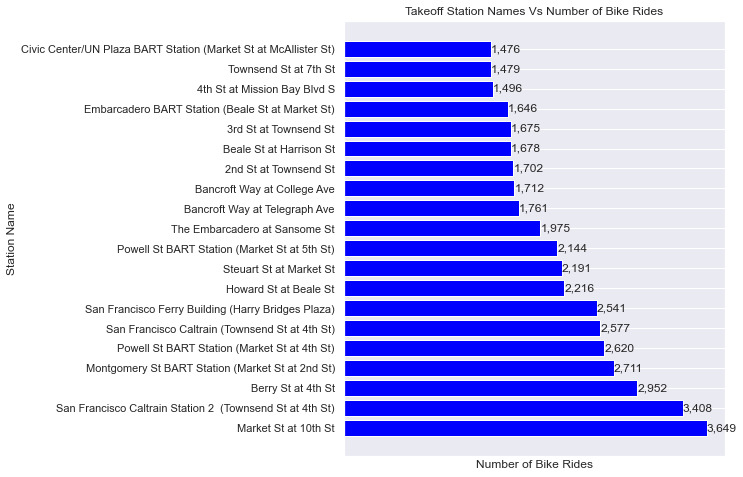

In [42]:
#Plotting the bar graph.
plt.figure(figsize = (15, 8))
make_hbar_chart(top_station_takeoffs, "start_station_name", "number_of_trips", "blue", "Number of Bike Rides",
               "Station Name", "Takeoff Station Names Vs Number of Bike Rides")

Result:

- Market St. at 10th St has the highest amount of takeoffs followed closely by the San Francisco Caltrain Station 2

Question 3B:

Which station(s) has the most arrivals?

In [43]:
#Creating dataframe for top 20 station arrivals
station_arrivals = new_data.groupby("end_station_name").size().reset_index(name = "number_of_trips")
top_station_arrivals = station_arrivals.nlargest(20, "number_of_trips")

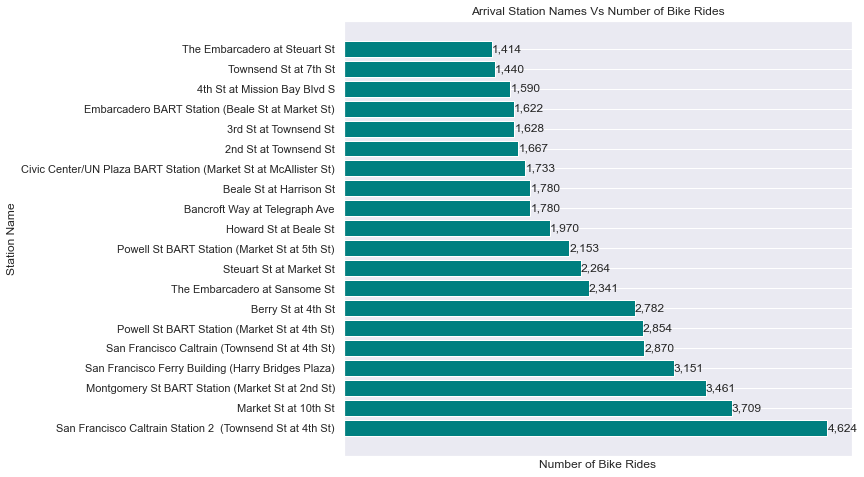

In [44]:
#Plotting the barchart
plt.figure(figsize = (20, 8))
make_hbar_chart(top_station_arrivals, "end_station_name", "number_of_trips", "teal", "Number of Bike Rides", 
               "Station Name", "Arrival Station Names Vs Number of Bike Rides")

Result:

- Again San Francisco Caltrain Station and Market St. at 10 St. have the highest arrivals but this time, in reverse order with San Francisco Caltrain Station having the highest arrivals with well over 4000 arrivals.

- Another thing of note is that the top 20 locations for takeoffs are also the top 20 locations for arrivals but in a different order.

Further Investigation:

- It might be benefitial to see both arrivals and takeoff values on the same chart. This would lead to a multivariate plot so this idea will be explored more in the multivariate section of the notebook

In [45]:
print("The table below gives the stations common to both top 20 takeoffs and arrivals\n")
station_takeoffs[station_takeoffs["start_station_name"].isin(station_arrivals["end_station_name"])]

The table below gives the stations common to both top 20 takeoffs and arrivals



,start_station_name,number_of_trips
0,10th Ave at E 15th St,55
1,10th St at Fallon St,345
2,10th St at University Ave,187
3,11th St at Bryant St,792
4,11th St at Natoma St,804
...,...,...
324,Williams Ave at 3rd St,48
325,Williams Ave at Apollo St,25
326,Willow St at Vine St,9
327,Woolsey St at Sacramento St,345


Question 4:

- What routes (i.e. station-to-station travel) are the most common?

In [46]:
new_data["route"] = new_data["start_station_name"] + " → " + new_data["end_station_name"]

common_routes = new_data.groupby("route").size().reset_index(name = "number_of_rides")
common_routes

,route,number_of_rides
0,10th Ave at E 15th St → 10th Ave at E 15th St,2
1,10th Ave at E 15th St → 10th St at Fallon St,4
2,10th Ave at E 15th St → 13th St at Franklin St,1
3,10th Ave at E 15th St → 21st Ave at Internatio...,1
4,10th Ave at E 15th St → 23rd Ave at Foothill Blvd,1
...,...,...
23298,Yerba Buena Center for the Arts (Howard St at ...,14
23299,Yerba Buena Center for the Arts (Howard St at ...,6
23300,Yerba Buena Center for the Arts (Howard St at ...,2
23301,Yerba Buena Center for the Arts (Howard St at ...,1


In [47]:
top_ten_routes = common_routes.nlargest(10, "number_of_rides")

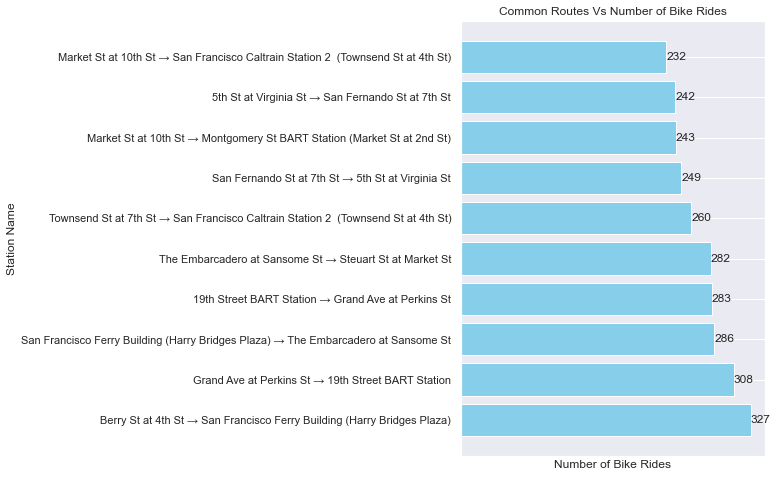

In [48]:
make_hbar_chart(top_ten_routes, "route", "number_of_rides", "skyblue", "Number of Bike Rides", "Station Name", 
               "Common Routes Vs Number of Bike Rides")

Result:

- The most common route taken by bikers is Berry St. at 4th St. to San Francisco Ferry Building (Harry Bridges Plaza)

Further Investigation:

- Now that we know which routes are the most commonly taken, we can make further findings about which routes are most commonly taken in both directions. 

- That is, how many bike rides go from station 1 to station 2, and how many bike rides go from station 2 to station 1?

- This question will be answered in the Multivariate section.

In [49]:
#new_data["takeoff_destination_set"]

In [50]:
#"10th Ave at E 15th St → 10th St at Fallon St" in common_routes["route"].values

In [51]:
#g = common_routes.route.map(lambda x: tuple(sorted(x.split(" → "))))
#g

In [52]:
#common_routes.groupby(g).agg({"number_of_rides" : "sum"}).reset_index(drop = True)

In [53]:
#s = "10th St at Fallon St → 10th Ave at E 15th St" 
#s.split(" → ")[1] + " → " + s.split(" → ")[0]

Question 5:

- Do certain age groups tend to follow some routes more than others?

In [54]:
#Creating age ranges for the dataset.
new_data["age_range"] = new_data["user_age"].apply(lambda x: str(int(np.round(x, -1))) + "'s")
new_data["age_range"].value_counts()

30's     76859
40's     43715
20's     30608
50's     14694
60's      7697
70's      1114
90's       112
80's        78
120's       70
100's        3
110's        1
140's        1
Name: age_range, dtype: int64

In [55]:
def make_heatmap(dataframe_obj, y_column_pivot, x_column_pivot, pivot_values, xlabel, ylabel):
    """
    This function helps make heatmaps. It takes in the following parameters:
    1. dataframe_obj: This is the dataframe object to generate the heatmap from.
    2. y_column_pivot: This is the column that will occupy the y-axis of the heatmap
    3. x_column_pivot: This is the column that will occupy the x-axis of the heatmap.
    4. pivot_values: This is the column that will determine the colors of the heatmap. They are the values the heatmap is
    depicting across the x_column_pivot and y_column_pivot values.
    
    """
    plt.figure(figsize = (8,200))
    pivoted_dataframe_obj = dataframe_obj.pivot(y_column_pivot, x_column_pivot, pivot_values)
    pivoted_dataframe_obj.fillna(0, inplace = True)
    sb.heatmap(pivoted_dataframe_obj, annot = True, fmt = "g")
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

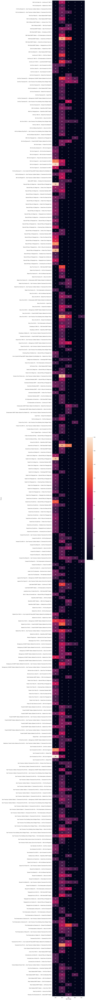

In [56]:
top_routes_by_age = new_data.groupby(["age_range", "route"]).size().reset_index(name = "number_of_rides")
top_400_routes_by_age = top_routes_by_age.nlargest(400, "number_of_rides")



make_heatmap(top_400_routes_by_age, "route", "age_range", "number_of_rides", "Age Range", "Route")

Result:

- Among the routes with the top 400 highest number of rides, we observe clearly that those who are in their 20's generally do not take the same routes as those in their 30's.

Question 6:

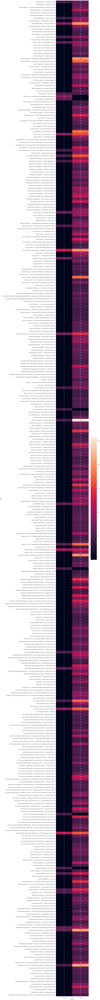

In [57]:
gender_routes = new_data.groupby(["member_gender", "route"]).size().reset_index(name = "number_of_rides")
top_400_routes_by_gender = gender_routes.nlargest(400, "number_of_rides")


make_heatmap(top_400_routes_by_gender, "route", "member_gender", "number_of_rides", "Gender", "Route")

Result: No new inferences could be made. Men being the majority of the users of the Bike sharing system, were more spread across the stations with very high number of riders.

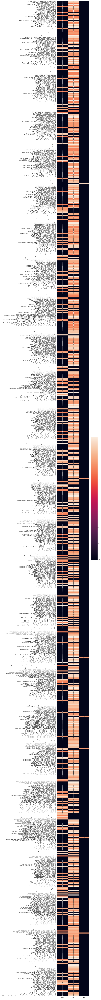

In [58]:
low_riders_by_gender = gender_routes[gender_routes["number_of_rides"] < 20]
top_lower_riders_by_gender = low_riders_by_gender.nlargest(1000, "number_of_rides")

make_heatmap(top_lower_riders_by_gender, "route", "member_gender", "number_of_rides", "Gender", "Route")

Result:
- At the lower scale bike sharing stations, there is a significant amount of segmentation by gender across the stations. That is, where you are likely to find ladies, will most likely NOT have a single male.

Question 6:

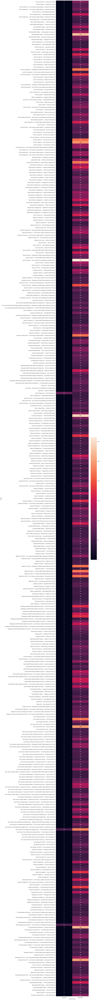

In [59]:
user_routes = new_data.groupby(["user_type", "route"]).size().reset_index(name = "number_of_rides")
top_400_routes_by_user = user_routes.nlargest(400, "number_of_rides")

make_heatmap(top_400_routes_by_user, "route", "user_type", "number_of_rides", "Type of User", "Route")

<Figure size 432x14400 with 0 Axes>

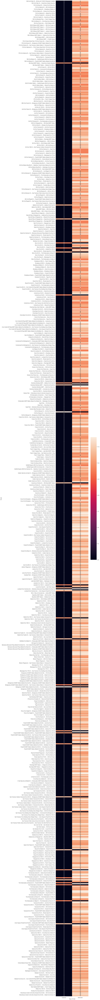

In [60]:
plt.figure(figsize = (6,200))

user_routes = new_data.groupby(["user_type", "route"]).size().reset_index(name = "number_of_rides")
low_rides_by_user = user_routes[user_routes["number_of_rides"] < 20]

top_low_rides_by_user = low_rides_by_user.nlargest(1000, "number_of_rides")

make_heatmap(top_low_rides_by_user, "route", "user_type", "number_of_rides", "Type of User", "Route")

Result:

- The stations with a lot of rides attract a huge number of Subscribers.

- The stations with much lower number of rides show us that there is significant segmentation between Customers and Subscribers. That is, stations where you are likely to find Customers, there is a high chance that you will not find a single Subscriber.

Follw-up Question:

Exploring the relationship between Gender and User Types

In [61]:
users = new_data["user_type"].unique()
genders = new_data["member_gender"].unique()

for gender in genders:
    for user in users:
        print(f"There are {new_data[(new_data['user_type'] == user) & (new_data['member_gender'] == gender)].shape[0]} {gender} {user}")
        
#print(f"There are {new_data[(new_data['user_type'] == 'Customer') & (new_data['member_gender'] == 'Male')].shape[0]} male customers")

There are 11493 Male Customer
There are 119007 Male Subscriber
There are 450 Other Customer
There are 3197 Other Subscriber
There are 4623 Female Customer
There are 36182 Female Subscriber


In [62]:
crosstab_data = pd.crosstab(new_data["user_type"], new_data["member_gender"])
crosstab_data

member_gender,Female,Male,Other
user_type,,,
Customer,4623,11493,450
Subscriber,36182,119007,3197


Text(0.5, 0, 'User Type')

<Figure size 720x720 with 0 Axes>

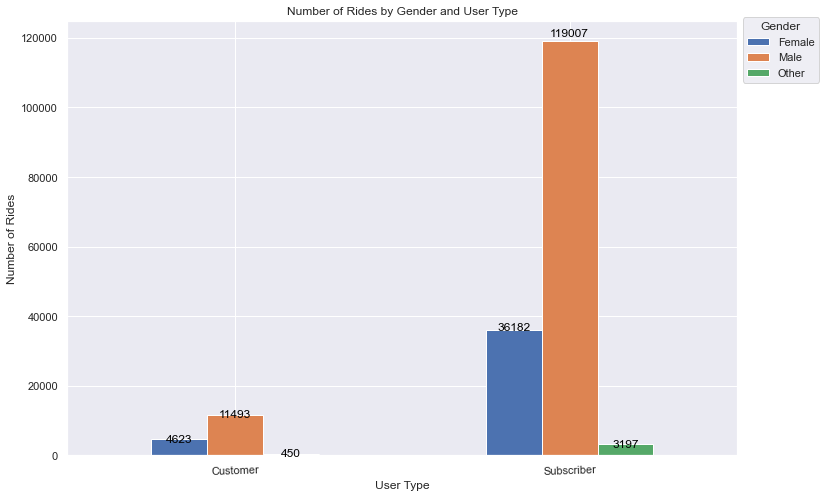

In [63]:
plt.figure(figsize = (10, 10))

bars = crosstab_data.plot(kind = "bar", rot =2)
bars.legend(title='Gender', bbox_to_anchor=(1, 1.02),
         loc='upper left')

for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2., 1.02 * height, int(height),
                ha='center', va='center', color='black')


plt.title("Number of Rides by Gender and User Type")
plt.ylabel("Number of Rides")
plt.xlabel("User Type")

Question 7:

- Number of rides against duration

In [64]:
common_routes_duration = new_data.groupby("route")[["duration_sec", "user_age"]].median().reset_index()

In [65]:
common_routes["median_duration_sec"] = common_routes_duration["duration_sec"].values
common_routes["median_user_age"] = common_routes_duration["user_age"].values

common_routes

,route,number_of_rides,median_duration_sec,median_user_age
0,10th Ave at E 15th St → 10th Ave at E 15th St,2,1377.5,45.0
1,10th Ave at E 15th St → 10th St at Fallon St,4,385.0,35.0
2,10th Ave at E 15th St → 13th St at Franklin St,1,3147.0,45.0
3,10th Ave at E 15th St → 21st Ave at Internatio...,1,331.0,42.0
4,10th Ave at E 15th St → 23rd Ave at Foothill Blvd,1,546.0,40.0
...,...,...,...,...
23298,Yerba Buena Center for the Arts (Howard St at ...,14,300.0,25.0
23299,Yerba Buena Center for the Arts (Howard St at ...,6,294.5,31.5
23300,Yerba Buena Center for the Arts (Howard St at ...,2,1164.5,34.0
23301,Yerba Buena Center for the Arts (Howard St at ...,1,1169.0,51.0


Text(0.5, 1.0, 'Number of Rides Vs Duration (Seconds)')

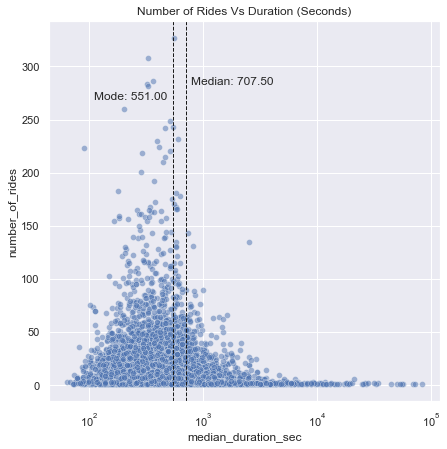

In [66]:
fig, ax = plt.subplots(figsize=(7, 7))
ax.set(xscale="log")
sb.scatterplot(x = "median_duration_sec", y = "number_of_rides", data = common_routes, ax = ax, alpha = 0.5)

mode_duration = common_routes["median_duration_sec"].mode()[0]
median_duration = common_routes["median_duration_sec"].median()

plt.axvline(median_duration, color='k', linestyle='dashed', linewidth=1)
plt.text(median_duration*1.1, median_duration/2.5, 'Median: {:.2f}'.format(median_duration))

plt.axvline(mode_duration, color='k', linestyle='dashed', linewidth=1)
plt.text(mode_duration*0.2, mode_duration/2.05, 'Mode: {:.2f}'.format(mode_duration))

plt.title("Number of Rides Vs Duration (Seconds)")

In [67]:
#sb.scatterplot(x = "median_duration_sec", y = "number_of_rides", data = common_routes, ax = ax, alpha = 0.5)
common_routes

,route,number_of_rides,median_duration_sec,median_user_age
0,10th Ave at E 15th St → 10th Ave at E 15th St,2,1377.5,45.0
1,10th Ave at E 15th St → 10th St at Fallon St,4,385.0,35.0
2,10th Ave at E 15th St → 13th St at Franklin St,1,3147.0,45.0
3,10th Ave at E 15th St → 21st Ave at Internatio...,1,331.0,42.0
4,10th Ave at E 15th St → 23rd Ave at Foothill Blvd,1,546.0,40.0
...,...,...,...,...
23298,Yerba Buena Center for the Arts (Howard St at ...,14,300.0,25.0
23299,Yerba Buena Center for the Arts (Howard St at ...,6,294.5,31.5
23300,Yerba Buena Center for the Arts (Howard St at ...,2,1164.5,34.0
23301,Yerba Buena Center for the Arts (Howard St at ...,1,1169.0,51.0


Result:

- Initially as the duration of rides via a particular route increase, the number of the rides also increase up to a certain point. Which implies that there is a goldilocks length of time for which a bike ride should last before the number of rides via that routes begins to decrease.

- In the plot above, from a few seconds all the way up to about 551 seconds (the mode), the number of rides via a particular route continues to increase. However, beyond this 551 second marker, the number of rides via these longer routes tend to decrease.

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

- The distribution for the weekends is very different from the distribution during weekdays.The weekdays distributions retain the bi-modal curve implying that the overall distribution was following the pattern for rush hour periods in a normal work day.

- The weekend distributions show that there is only one peak period which is around 1pm-3pm on Saturdays and 1pm - 4pm on Sundays.

- Another noticeable difference is that while bike activities reach as high as 3000 to 4000 during weekdays, weekends have less than 1500 biking activities.

- The Customers had far less bike activity and this is due to the fact that  there are more than 10 times more Subscribers as there are Customers.

- The median riding duration for Customers is 763 seconds while the median for Subscribers is 489 seconds. This means that typically, a Customer rides the bikes for a longer period of time than a Subscriber.

- This difference is about 274 seconds which roughly equates to 4 minutes 34 seconds. We can thus hypothesize that Customers are generally more fit than Subscribers. But this is dependent on whether a difference of riding time of 4 minutes, 34 seconds is enough to establish this hypothesis.

- Another implication is that Customers typically tend to cover more distance.

- Market St. at 10th St has the highest amount of takeoffs followed closely by the San Francisco Caltrain Station 2.

- Again San Francisco Caltrain Station and Market St. at 10 St. have the highest arrivals but this time, in reverse order with San Francisco Caltrain Station having the highest arrivals with well over 4000 arrivals.


- The most common route taken by bikers is Berry St. at 4th St. to San Francisco Ferry Building (Harry Bridges Plaza)

- The stations with much lower number of rides show us that there is significant segmentation between Customers and Subscribers. That is, stations where you are likely to find Customers, there is a high chance that you will not find a single Subscriber.
- At the lower scale bike sharing stations, there is a significant amount of segmentation by gender across the stations. That is, where you are likely to find ladies, will most likely NOT have a single male.

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

No, I did not

## Multivariate Exploration


Question:

- Summary of the arrivals and takeoffs data for each station.

In [68]:
#Making copies of the dataframes
station_takeoffs_cp = station_takeoffs.copy()
station_arrivals_cp = station_arrivals.copy()

#Creating "takeoffs and arrivals" column so that we can have columns for takeoffs and arrivals
station_takeoffs_cp["takeoffs_and_arrivals"] = "takeoff"
station_arrivals_cp["takeoffs_and_arrivals"] = "arrival"

#Creating a common station name called "station_name" for both dataframes
station_takeoffs_cp["station_name"] = station_takeoffs_cp["start_station_name"]
station_arrivals_cp["station_name"] = station_arrivals_cp["end_station_name"]

#Drop the original station name columns; "start_station_name" and "end_station_name"
station_takeoffs_cp.drop(["start_station_name"], axis = 1, inplace = True)
station_arrivals_cp.drop(["end_station_name"], axis = 1, inplace = True)

#Since we are only interested in the top 11 takeoffs and arrivals, we concatenate just the top 11 "number_of_trips" values from both dataframes
trips = pd.concat([station_arrivals_cp, station_takeoffs_cp])

In [69]:
top_trips = trips[trips["station_name"].isin(trips.nlargest(30, "number_of_trips")["station_name"])]

In [70]:
top_trips

,number_of_trips,takeoffs_and_arrivals,station_name
40,1667,arrival,2nd St at Townsend St
45,1628,arrival,3rd St at Townsend St
77,1073,arrival,Bancroft Way at College Ave
78,1780,arrival,Bancroft Way at Telegraph Ave
80,1780,arrival,Beale St at Harrison St
82,2782,arrival,Berry St at 4th St
103,1733,arrival,Civic Center/UN Plaza BART Station (Market St ...
170,1970,arrival,Howard St at Beale St
199,3709,arrival,Market St at 10th St
220,3461,arrival,Montgomery St BART Station (Market St at 2nd St)


In [71]:
def make_clustered_hbar_chart(dataframe_object, x_vals, y_vals, hue_column, xlabel, ylabel, title, palette = None):
    """
    The function helps us to create a clustered horizontal bar chart. The parameters it takes are given below:
    1. dataframe_object: This is the dataframe object that holds the data to be plotted.
    2. x_vals: This refers to the values we want on the x-axis. (Usually numbers)
    3. y_vals: This refers to the values we want on the y-axis. (Usually strings)
    4. hue_column: This is the column from our dataframe object that determines the color of the bars of the bar chart.
    5. xlabel: This refers to the name of the entire x-axis.
    6. ylabel: This refers to the name of the entire y-axis.
    7. title: This refers to the name of the entire chart
    
    """
    plt.figure(figsize = (8, 10))
    sb.set_palette(palette)
    ax1 = sb.barplot(x = x_vals, y = y_vals, hue = hue_column, data = dataframe_object, orient= "h")
    for p in ax1.patches:
        width = p.get_width()
        ax1.text(p.get_width(), p.get_y()+0.5*p.get_height(),
                 '{:,}'.format(width),
                 ha='left', va='center')
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xticks([]);

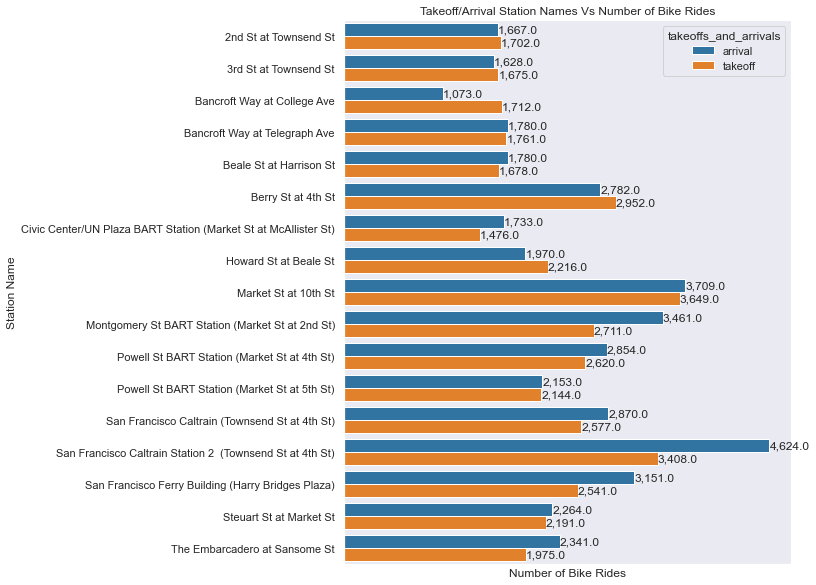

In [72]:
make_clustered_hbar_chart(top_trips, "number_of_trips", "station_name", "takeoffs_and_arrivals", "Number of Bike Rides",
                         "Station Name", "Takeoff/Arrival Station Names Vs Number of Bike Rides", "tab10")

Result:

- In terms of commute, the San Francisco Caltrain Station 2 (Townsend St at 4th St) has by far the largest amount of arrivals and the second largest amount of takeoffs. This makes it the most busy station in the entire dataset. Market St at 10 St. is the second most busy station with similar numbers of arrivals and takeoffs.

Question:

Are common routes common because the time taken to complete the journey is low?

In [73]:
common_routes

,route,number_of_rides,median_duration_sec,median_user_age
0,10th Ave at E 15th St → 10th Ave at E 15th St,2,1377.5,45.0
1,10th Ave at E 15th St → 10th St at Fallon St,4,385.0,35.0
2,10th Ave at E 15th St → 13th St at Franklin St,1,3147.0,45.0
3,10th Ave at E 15th St → 21st Ave at Internatio...,1,331.0,42.0
4,10th Ave at E 15th St → 23rd Ave at Foothill Blvd,1,546.0,40.0
...,...,...,...,...
23298,Yerba Buena Center for the Arts (Howard St at ...,14,300.0,25.0
23299,Yerba Buena Center for the Arts (Howard St at ...,6,294.5,31.5
23300,Yerba Buena Center for the Arts (Howard St at ...,2,1164.5,34.0
23301,Yerba Buena Center for the Arts (Howard St at ...,1,1169.0,51.0


In [74]:
#Creating top 30 routes and bottom 30 routes by number of rides
top_routes = common_routes.nlargest(30, "number_of_rides")
bottom_routes = common_routes.nsmallest(30, "number_of_rides")

In [75]:
top_routes

,route,number_of_rides,median_duration_sec,median_user_age
5861,Berry St at 4th St → San Francisco Ferry Build...,327,559.0,34.0
11018,Grand Ave at Perkins St → 19th Street BART Sta...,308,330.0,34.0
18835,San Francisco Ferry Building (Harry Bridges Pl...,286,362.0,34.0
1750,19th Street BART Station → Grand Ave at Perkin...,283,320.0,33.0
20760,The Embarcadero at Sansome St → Steuart St at ...,282,327.5,40.0
21192,Townsend St at 7th St → San Francisco Caltrain...,260,203.5,32.0
18273,San Fernando St at 7th St → 5th St at Virginia St,249,517.0,24.0
14168,Market St at 10th St → Montgomery St BART Stat...,243,543.0,27.0
4515,5th St at Virginia St → San Fernando St at 7th St,242,462.5,24.0
14185,Market St at 10th St → San Francisco Caltrain ...,232,603.0,29.0


No handles with labels found to put in legend.


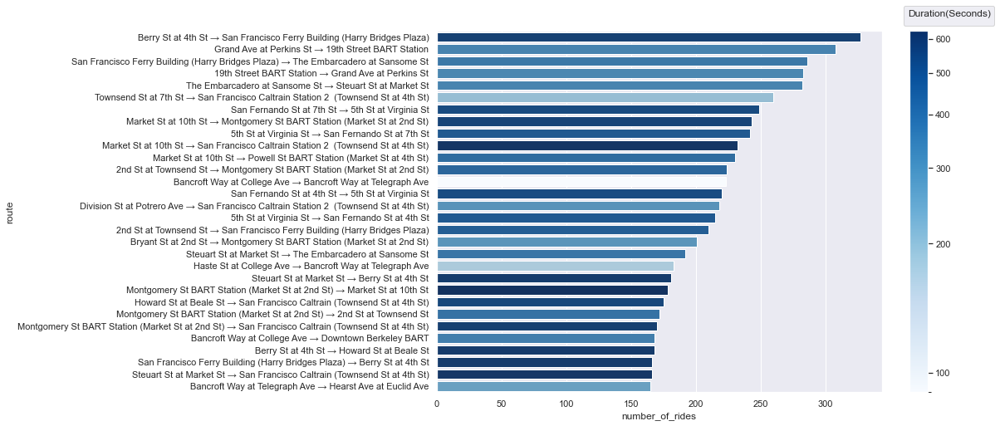

In [76]:
import matplotlib.colors as colors

pal = sb.color_palette("Greens_d", 6)
norm = colors.LogNorm(vmin=top_routes["median_duration_sec"].min(), vmax=top_routes["median_duration_sec"].max())
color_vals = [plt.cm.Blues(norm(c)) for c in top_routes["median_duration_sec"]]

ax = sb.barplot(data = top_routes, x = "number_of_rides", y = "route", palette= color_vals)
plt.legend(bbox_to_anchor=(1.05, 1.07),borderaxespad=0., loc=2, title='Duration(Seconds)')

sm = plt.cm.ScalarMappable(cmap="Blues", norm=norm)
sm.set_array([])
#ax.get_legend().remove()
cbar = ax.figure.colorbar(sm)
cbar.set_ticks([100, 200, 300, 400, 500, 600])
cbar.set_ticklabels(["100", "200", "300", "400", "500", "600"])

No handles with labels found to put in legend.


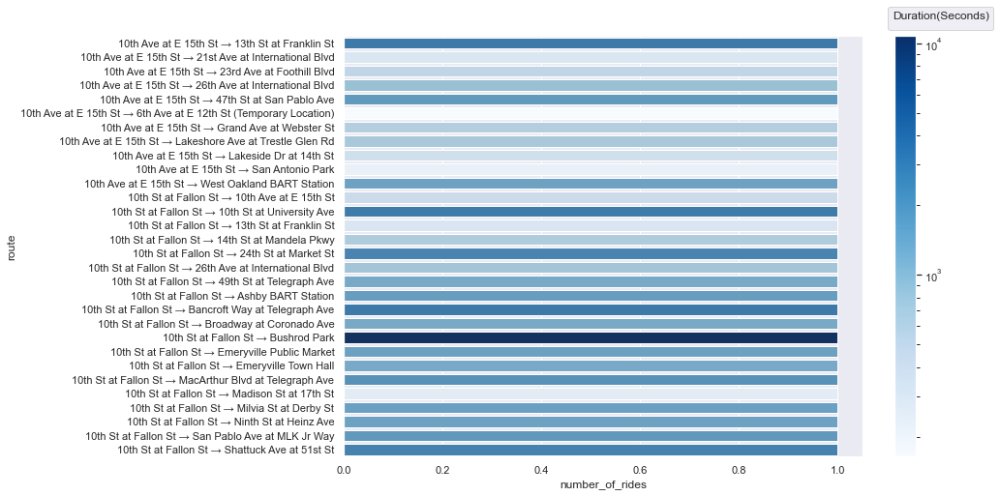

In [77]:
from matplotlib.colors import DivergingNorm
import matplotlib.colors as colors

pal = sb.color_palette("Greens_d", 6)
norm = colors.LogNorm(vmin=bottom_routes["median_duration_sec"].min(), vmax=bottom_routes["median_duration_sec"].max())
color_vals = [plt.cm.Blues(norm(c)) for c in bottom_routes["median_duration_sec"]]
#color_vals.reverse()
#norm = plt.Normalize(tips['size'].min(), tips['size'].max())
#cmap = sns.cubehelix_palette(light=1, as_cmap=True)
ax = sb.barplot(data = bottom_routes, x = "number_of_rides", y = "route", palette= color_vals)

plt.legend(bbox_to_anchor=(1.05, 1.07),borderaxespad=0., loc=2, title='Duration(Seconds)');

sm = plt.cm.ScalarMappable(cmap="Blues", norm=norm)
sm.set_array([])
#ax.get_legend().remove()
ax.figure.colorbar(sm)

<AxesSubplot:>

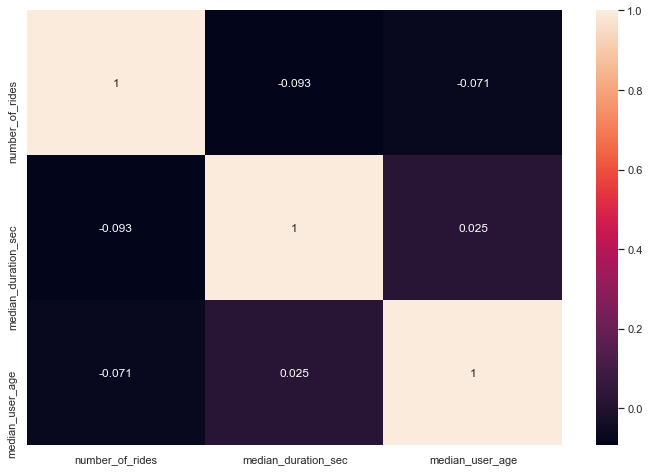

In [78]:
common_routes_corr = common_routes.corr()

sb.heatmap(common_routes_corr, annot= True)

Result:

- There appears to be no relationship between duration of travel (given by color in the first two bar charts) and number of rides talk less of a causal relationship with duration of travel having an effect on number of rides.

- The top 30 routes chosen show various durations given by the colors, irrespective of how many rides plying a route. The same is observed for the bottom 30.

- The clincher is the heatmap depicting the linear correlation between the number of rides, duration of travel, and the median age of the users. All the correlations of these features are close to 0, implying at least, that there is no linear relationship between them.

Which route (i.e. station-to-station commute) has the highest amount of activity?

In [79]:
#Creating a column named "takeoff_destination_set". 
#This column contains the set of takeoff and destination stations in a set.
#The reason for this is that if bike rides go from station 1 to station 2, the same route (or distance) is assumed to be taken
#if bikes move from station 2 to station 1.
#Therefore, it makes sense to create such column to help us categorize all journeys from station 1 to station 2 and vice-versa.

new_data["takeoff_destination_set"] = new_data["route"].apply(lambda x: tuple(sorted(set(x.split(" → ")))))
common_routes = new_data.groupby(["takeoff_destination_set", "route"]).size().reset_index(name = "number_of_rides")
common_routes

,takeoff_destination_set,route,number_of_rides
0,"(10th Ave at E 15th St,)",10th Ave at E 15th St → 10th Ave at E 15th St,2
1,"(10th Ave at E 15th St, 10th St at Fallon St)",10th Ave at E 15th St → 10th St at Fallon St,4
2,"(10th Ave at E 15th St, 10th St at Fallon St)",10th St at Fallon St → 10th Ave at E 15th St,1
3,"(10th Ave at E 15th St, 13th St at Franklin St)",10th Ave at E 15th St → 13th St at Franklin St,1
4,"(10th Ave at E 15th St, 13th St at Franklin St)",13th St at Franklin St → 10th Ave at E 15th St,1
...,...,...,...
23298,"(Williams Ave at 3rd St,)",Williams Ave at 3rd St → Williams Ave at 3rd St,4
23299,"(Williams Ave at 3rd St, Williams Ave at Apoll...",Williams Ave at Apollo St → Williams Ave at 3r...,3
23300,"(Willow St at Vine St,)",Willow St at Vine St → Willow St at Vine St,1
23301,"(Woolsey St at Sacramento St,)",Woolsey St at Sacramento St → Woolsey St at Sa...,13


In [80]:
#Creating a "forward" and "backward" encoding to help us know which direction the bikes are moving from station 1 to station 2.
j = common_routes["takeoff_destination_set"] != common_routes["takeoff_destination_set"].shift()
common_routes["route_direction"] = j.apply(lambda x: "forward →" if (x) else "backward ←")
common_routes

,takeoff_destination_set,route,number_of_rides,route_direction
0,"(10th Ave at E 15th St,)",10th Ave at E 15th St → 10th Ave at E 15th St,2,forward →
1,"(10th Ave at E 15th St, 10th St at Fallon St)",10th Ave at E 15th St → 10th St at Fallon St,4,forward →
2,"(10th Ave at E 15th St, 10th St at Fallon St)",10th St at Fallon St → 10th Ave at E 15th St,1,backward ←
3,"(10th Ave at E 15th St, 13th St at Franklin St)",10th Ave at E 15th St → 13th St at Franklin St,1,forward →
4,"(10th Ave at E 15th St, 13th St at Franklin St)",13th St at Franklin St → 10th Ave at E 15th St,1,backward ←
...,...,...,...,...
23298,"(Williams Ave at 3rd St,)",Williams Ave at 3rd St → Williams Ave at 3rd St,4,forward →
23299,"(Williams Ave at 3rd St, Williams Ave at Apoll...",Williams Ave at Apollo St → Williams Ave at 3r...,3,forward →
23300,"(Willow St at Vine St,)",Willow St at Vine St → Willow St at Vine St,1,forward →
23301,"(Woolsey St at Sacramento St,)",Woolsey St at Sacramento St → Woolsey St at Sa...,13,forward →


In [81]:
mapping = new_data.groupby(["takeoff_destination_set"]).size().reset_index(name = "total_number_of_rides")
common_routes = pd.merge(common_routes, mapping, on = "takeoff_destination_set")

In [82]:
#Top_return_journeys helps us to find the top 30 routes by number of rides
top_return_journeys = common_routes[common_routes["takeoff_destination_set"].isin(common_routes.nlargest(30, "total_number_of_rides")["takeoff_destination_set"])].copy()

top_return_journeys["reference_direction"] = np.NaN

top_return_journeys["reference_direction"] = np.where(top_return_journeys["route_direction"] == "forward →", top_return_journeys["route"].values, top_return_journeys["reference_direction"])

top_return_journeys["reference_direction"] = top_return_journeys["reference_direction"].ffill(axis = 0)

top_return_journeys["reference_direction"] = top_return_journeys["reference_direction"].str.replace("→", "↔")

top_return_journeys

,takeoff_destination_set,route,number_of_rides,route_direction,total_number_of_rides,reference_direction
3319,"(19th Street BART Station, Grand Ave at Perkin...",19th Street BART Station → Grand Ave at Perkin...,283,forward →,591,19th Street BART Station ↔ Grand Ave at Perkin...
3320,"(19th Street BART Station, Grand Ave at Perkin...",Grand Ave at Perkins St → 19th Street BART Sta...,308,backward ←,591,19th Street BART Station ↔ Grand Ave at Perkin...
5387,"(2nd Ave at E 18th St, Lake Merritt BART Station)",2nd Ave at E 18th St → Lake Merritt BART Station,163,forward →,328,2nd Ave at E 18th St ↔ Lake Merritt BART Station
5388,"(2nd Ave at E 18th St, Lake Merritt BART Station)",Lake Merritt BART Station → 2nd Ave at E 18th St,165,backward ←,328,2nd Ave at E 18th St ↔ Lake Merritt BART Station
5722,"(2nd St at Townsend St, Montgomery St BART Sta...",2nd St at Townsend St → Montgomery St BART Sta...,224,forward →,396,2nd St at Townsend St ↔ Montgomery St BART Sta...
5723,"(2nd St at Townsend St, Montgomery St BART Sta...",Montgomery St BART Station (Market St at 2nd S...,172,backward ←,396,2nd St at Townsend St ↔ Montgomery St BART Sta...
5757,"(2nd St at Townsend St, San Francisco Ferry Bu...",2nd St at Townsend St → San Francisco Ferry Bu...,210,forward →,354,2nd St at Townsend St ↔ San Francisco Ferry Bu...
5758,"(2nd St at Townsend St, San Francisco Ferry Bu...",San Francisco Ferry Building (Harry Bridges Pl...,144,backward ←,354,2nd St at Townsend St ↔ San Francisco Ferry Bu...
8051,"(5th St at Virginia St, San Fernando St at 4th...",5th St at Virginia St → San Fernando St at 4th St,215,forward →,435,5th St at Virginia St ↔ San Fernando St at 4th St
8052,"(5th St at Virginia St, San Fernando St at 4th...",San Fernando St at 4th St → 5th St at Virginia St,220,backward ←,435,5th St at Virginia St ↔ San Fernando St at 4th St


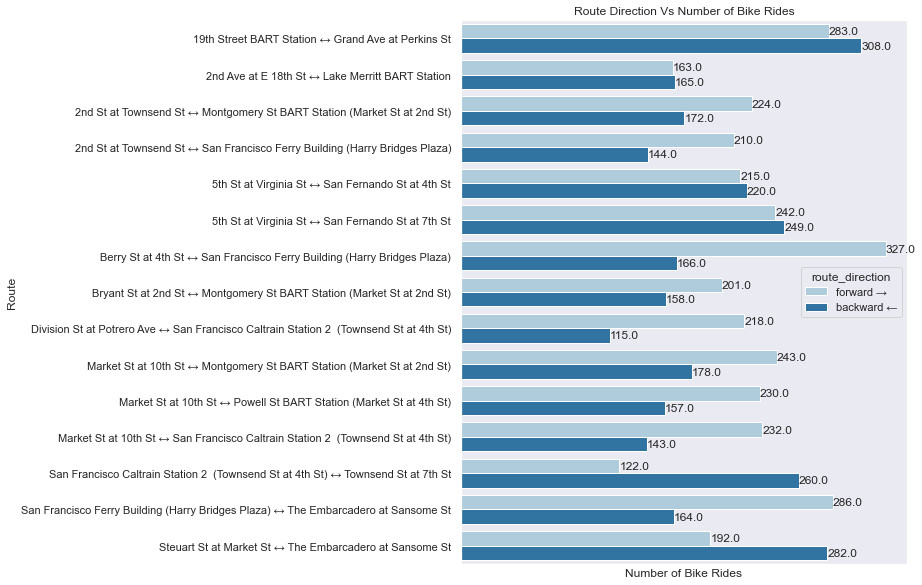

In [83]:
make_clustered_hbar_chart(top_return_journeys, "number_of_rides", "reference_direction", "route_direction", "Number of Bike Rides",
                         "Route", "Route Direction Vs Number of Bike Rides", "Paired")

Result:

- We observe that the highest bike activity is experienced when moving from Berry St. at 4th St. to San Francisco Ferry Building (Harry Bridges Plaza)

- The next highest activity is experienced when moving from Grand Ave at Perkins St. "back" to 19th Street BART Station

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

- In terms of commute, the San Francisco Caltrain Station 2 (Townsend St at 4th St) has by far the largest amount of arrivals and the second largest amount of takeoffs. This makes it the most busy station in the entire dataset. Market St at 10 St. is the second most busy station with similar numbers of arrivals and takeoffs.

- We observe that the highest bike activity is experienced when moving from Berry St. at 4th St. to San Francisco Ferry Building (Harry Bridges Plaza)

- The next highest activity is experienced when moving from Grand Ave at Perkins St. "back" to 19th Street BART Station

### Were there any interesting or surprising interactions between features?

> There appears to be no relationship between duration of travel (given by color in the first two bar charts) and number of rides talk less of a causal relationship with duration of travel having an effect on number of rides.


## Conclusions
>You can write a summary of the main findings and reflect on the steps taken during the data exploration.

- There are more males using the bike sharing system than females.

- Weekday and Weekends experience two different patterns for Biking activity.

- There are far more Subscribers than there are Customers.

- The Customers ride bikes for much longer than Subscribers.

- Market St at 10th St. has the highest amount of takeoffs while San Francisco Caltrain Station has the highest arrivals.

- The most common route taken by bikers is Berry St. at 4th St. to San Francisco Ferry Building (Harry Bridges Plaza)

- San Francisco Caltrain Station 2 is the most busy station.

- The highest bike activity is observed when bikes move from Berry St. at 4th St. to San Francisco Ferry Building (Harry Bridges Plaza)


> Remove all Tips mentioned above, before you convert this notebook to PDF/HTML


> At the end of your report, make sure that you export the notebook as an
html file from the `File > Download as... > HTML or PDF` menu. Make sure you keep
track of where the exported file goes, so you can put it in the same folder
as this notebook for project submission. Also, make sure you remove all of
the quote-formatted guide notes like this one before you finish your report!

